In [0]:
# Access keys config
spark.conf.set("fs.s3a.access.key", "XXXXXXXXXXXXXXXXXX")
spark.conf.set("fs.s3a.secret.key", "YYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYY")
spark.conf.set("fs.s3a.impl", "org.apache.hadoop.fs.s3a.S3AFileSystem")
spark.conf.set("fs.s3a.endpoint", "s3.amazonaws.com")
spark.conf.set("fs.s3a.aws.credentials.provider", "org.apache.hadoop.fs.s3a.SimpleAWSCredentialsProvider")


#### Reading data from silver layer bucket

In [0]:
payments_df = spark.read.option("header", "true").parquet("s3://ecommerce-sales-project/silver/payments_processed")
products_df = spark.read.option("header", "true").parquet("s3://ecommerce-sales-project/silver/products_processed")
sellers_df = spark.read.option("header", "true").parquet("s3://ecommerce-sales-project/silver/sellers_processed")
orders_df = spark.read.option("header", "true").parquet("s3://ecommerce-sales-project/silver/orders_processed")
order_items_df = spark.read.option("header", "true").parquet("s3://ecommerce-sales-project/silver/order_items_processed")
customers_df = spark.read.option("header", "true").parquet("s3://ecommerce-sales-project/silver/customers_processed")


#### Creating combined dataframes for golden layer

In [0]:
#creating orders combined df
total_orders_df = order_items_df.join(orders_df, order_items_df.order_id == orders_df.order_id, "inner") \
                                .join(sellers_df, order_items_df.seller_id == sellers_df.seller_id, "inner") \
                                .select(orders_df['*'], \
                                order_items_df['order_item_id'], order_items_df['product_id'], order_items_df['seller_id'], \
                                order_items_df['price'], order_items_df['freight_value'], order_items_df['total_price'])
items_customers_df = orders_df.join(customers_df, orders_df.customer_id == customers_df.customer_id, "inner")
final_orders_df = total_orders_df.join(items_customers_df, total_orders_df.order_id == items_customers_df.order_id, "inner") \
                                 .select(total_orders_df['*'], \
                                  items_customers_df['customer_unique_id'], items_customers_df['zip_code'], \
                                  items_customers_df['customer_city'], items_customers_df['customer_state'])

In [0]:
display(final_orders_df)

order_id,customer_id,order_status,order_purchase_date,order_estimated_delivery_date,order_delivery_date,order_item_id,product_id,seller_id,price,freight_value,total_price,customer_unique_id,zip_code,customer_city,customer_state
fc79d61f2a305370fd69ee2c8048d5af,0c838ef80e244083eebe4db0da227bb2,delivered,2017-06-05T18:47:22.000+0000,2017-06-13T15:11:05.000+0000,2017-06-06T15:28:29.000+0000,1,b1b787a4d7563b9e375ee8af5bee4a74,ebd2d60905fb58271facef5596b620d3,74.9,21.01,95.91,b5f48e65c14e0e73846f1b0f8611c64e,93125,sao leopoldo,RS
1826d2a2eb6ba6e3e4da3ffd1293ba5b,f8d4fd17a8f45986298a522b397522d0,delivered,2018-04-19T15:47:11.000+0000,2018-05-02T14:38:35.000+0000,2018-04-20T16:56:29.000+0000,1,62892a47bea324c325a4556b66baef9d,7daca0837f033a41a6f3428c18657533,197.9,34.93,232.83,d6dfecf0d36b4f41d87bec2c1d538856,85857,foz do iguacu,PR
744dddb0362cbcb141adaed27f19cb3a,08c07e9a2ca88f8c94694bd4972a4eed,delivered,2017-03-08T19:30:26.000+0000,2017-03-18T09:21:56.000+0000,2017-03-10T10:48:01.000+0000,1,b35ce9c1e37f5b0f4134da0fe4c93b84,dd2bdf855a9172734fbc3744021ae9b9,69.9,26.3,96.2,2454d481eb521ebf016dd2ef39314a73,76804,porto velho,RO
7fe938a0f8240a6154b0bb4b588ed606,0145c94f89448a156864199db4c3b826,delivered,2017-06-08T21:32:05.000+0000,2017-06-23T10:57:47.000+0000,2017-06-09T11:03:39.000+0000,1,77cc62dc80ebe12a0452d1ce0565acdc,218d46b86c1881d022bce9c68a7d4b15,113.0,18.04,131.04,021f9b70becbc032905f24f7e6c2d7d7,27313,barra mansa,RJ
3df9a0706897e062e91f253fa132b6dd,04c834ed53ed3ebdf68fa561bdc20e5e,delivered,2018-08-16T12:49:01.000+0000,2018-08-20T20:33:08.000+0000,2018-08-17T15:32:00.000+0000,1,292339442aafc77526bf025a199db898,1e8b33f18b4f7598d87f5cbee2282cc2,219.9,26.52,246.42,09c7e80b1e64aef42787f124fa7b987f,1548,sao paulo,SP
05afef1c185862cab9062b322ff25cc5,296de103322e463a1b76de3c81fdf02b,delivered,2017-07-25T10:47:16.000+0000,2017-08-21T21:10:53.000+0000,2017-07-31T15:49:35.000+0000,1,ac7e981115ad47f0e051f1b8b97e73b1,53e4c6e0f4312d4d2107a8c9cddf45cd,27.99,22.67,50.66,7857dff0702239bcf889f6af345fe607,59151,parnamirim,RN
05afef1c185862cab9062b322ff25cc5,296de103322e463a1b76de3c81fdf02b,delivered,2017-07-25T10:47:16.000+0000,2017-08-21T21:10:53.000+0000,2017-07-31T15:49:35.000+0000,2,ac7e981115ad47f0e051f1b8b97e73b1,53e4c6e0f4312d4d2107a8c9cddf45cd,27.99,22.67,50.66,7857dff0702239bcf889f6af345fe607,59151,parnamirim,RN
317d836ac628026b3639e69c710946b3,e2231800a5e5bbcb32cff22e6bb931c4,delivered,2017-10-30T15:11:39.000+0000,2017-11-10T20:14:44.000+0000,2017-10-31T18:33:47.000+0000,1,522e80f11e2431474e70300f12a6e45f,5eeb9c756d9780b96283e5a2ac6da334,317.0,27.06,344.06,5dbcfd1a3cc694bfecc93ca15d884c9d,75170,goianapolis,GO
01d907b3e209269e120a365fc2b97524,d02cc92f5e33eb58d9ff4d5cce6ae901,delivered,2017-08-09T16:21:06.000+0000,2017-08-16T22:34:11.000+0000,2017-08-11T19:05:53.000+0000,1,b1434a8f79cb3528540d9b21e686e823,d1c281d3ae149232351cd8c8cc885f0d,151.99,17.77,169.76,a7b781410bcc8bbf3221f48ff45aae6d,8503,ferraz de vasconcelos,SP
6d7b9cba0e798f9b68b2c0745b38859a,9dc4cf072184adc87274ccd4811b508a,delivered,2017-10-16T12:18:33.000+0000,2017-10-23T17:45:05.000+0000,2017-10-19T17:12:56.000+0000,1,da6f9d8ce4950ad572b7b4fe7d7e6c90,8b28d096634035667e8263d57ba3368c,97.9,12.19,110.09,66ae4493fc7c710a8db6d9620901f40d,2067,sao paulo,SP


In [0]:
#creating products and payments combined df:
final_product_payments_df = order_items_df.join(products_df, order_items_df.product_id == products_df.product_id) \
                                          .join(payments_df, order_items_df.order_id == payments_df.order_id) \
                                          .select(order_items_df['*'], \
                                           products_df['product_category'], products_df['product_weight_g'], products_df['product_length_cm'], products_df['product_height_cm'],products_df['product_width_cm'], \
                                           payments_df['payment_sequential'], payments_df['payment_type'], payments_df['payment_installments'], payments_df['payment_value'], payments_df['payment_processing_time'])

In [0]:
display(final_product_payments_df)

order_id,order_item_id,product_id,seller_id,price,freight_value,total_price,product_category,product_weight_g,product_length_cm,product_height_cm,product_width_cm,payment_sequential,payment_type,payment_installments,payment_value,payment_processing_time
8ac26cb701a7887cc7c458683408c56a,1,4ebb87ba41ca446326804d0e7f8dcc93,7a67c85e85bb2ce8582c35f2203ad736,109.99,18.02,128.01,COOL STUFF,1500,42,25,15,1,credit_card,1,128.01,2024-07-02T14:31:27.264+0000
8ac2728285fd4228f35d907768b5288a,1,8b90be4893a4277a9f33c5b2348cf9c6,004c9cd9d87a3c30c522c48c4fc07416,109.99,8.27,118.26,BED TABLE BATH,2000,42,10,36,1,credit_card,4,156.56,2024-07-02T14:31:27.264+0000
8ac2728285fd4228f35d907768b5288a,1,8b90be4893a4277a9f33c5b2348cf9c6,004c9cd9d87a3c30c522c48c4fc07416,109.99,8.27,118.26,BED TABLE BATH,2000,42,10,36,2,credit_card,6,495.78,2024-07-02T14:31:27.264+0000
8ac2728285fd4228f35d907768b5288a,2,fa94f25a73969e3a25d52706e246dfcc,004c9cd9d87a3c30c522c48c4fc07416,109.99,16.55,126.54,BED TABLE BATH,1700,42,10,36,1,credit_card,4,156.56,2024-07-02T14:31:27.264+0000
8ac2728285fd4228f35d907768b5288a,2,fa94f25a73969e3a25d52706e246dfcc,004c9cd9d87a3c30c522c48c4fc07416,109.99,16.55,126.54,BED TABLE BATH,1700,42,10,36,2,credit_card,6,495.78,2024-07-02T14:31:27.264+0000
8ac2728285fd4228f35d907768b5288a,3,b01cedfa96d891427058852f0625e9ee,004c9cd9d87a3c30c522c48c4fc07416,259.99,21.01,281.0,null,4900,42,16,37,1,credit_card,4,156.56,2024-07-02T14:31:27.264+0000
8ac2728285fd4228f35d907768b5288a,3,b01cedfa96d891427058852f0625e9ee,004c9cd9d87a3c30c522c48c4fc07416,259.99,21.01,281.0,null,4900,42,16,37,2,credit_card,6,495.78,2024-07-02T14:31:27.264+0000
8ac2728285fd4228f35d907768b5288a,4,fa94f25a73969e3a25d52706e246dfcc,004c9cd9d87a3c30c522c48c4fc07416,109.99,16.55,126.54,BED TABLE BATH,1700,42,10,36,1,credit_card,4,156.56,2024-07-02T14:31:27.264+0000
8ac2728285fd4228f35d907768b5288a,4,fa94f25a73969e3a25d52706e246dfcc,004c9cd9d87a3c30c522c48c4fc07416,109.99,16.55,126.54,BED TABLE BATH,1700,42,10,36,2,credit_card,6,495.78,2024-07-02T14:31:27.264+0000
8ac2a7536043523a10fb4d60487a7a4f,1,5e0a88877b8f7889949d0a7b3fc12d14,8d956fec2e4337affcb520f56fd8cbfd,65.99,11.48,77.47,SPORT LEISURE,770,15,10,11,1,UPI,1,77.47,2024-07-02T14:31:27.264+0000


In [0]:
#saving to the golden layer

final_orders_df.write.mode("overwrite").parquet("s3://ecommerce-sales-project/gold/final_orders_df")
final_product_payments_df.write.mode("overwrite").parquet("s3://ecommerce-sales-project/gold/final_product_payments_df")


#### Extraction of selected aggregations

In [0]:
#finding the product with the largest dimensions

from pyspark.sql.functions import concat, lit, col

products_new_df = products_df.withColumn("measures [l x h x w]", \
                              concat(col("product_length_cm"), lit(" x "), \
                              col("product_height_cm"), lit(" x "), col("product_width_cm"))) \
                              .withColumn("total_surface[cm^3]", col("product_length_cm") * col("product_height_cm") * col("product_width_cm"))

biggest_product_df = products_new_df.select("product_id", "product_category", "measures [l x h x w]", "total_surface[cm^3]") \
                                    .orderBy(col('total_surface[cm^3]').desc())

packet_locker_df = biggest_product_df.filter(biggest_product_df['total_surface[cm^3]'] < 150000)

biggest_toys_df = biggest_product_df.filter((biggest_product_df['total_surface[cm^3]'] < 150000) & (biggest_product_df['product_category'] == 'TOYS'))

In [0]:
biggest_product_df.show(5)

+--------------------+--------------------+--------------------+-------------------+
|          product_id|    product_category|measures [l x h x w]|total_surface[cm^3]|
+--------------------+--------------------+--------------------+-------------------+
|256a9c364b75753b9...|          HOUSEWARES|        68 x 66 x 66|             296208|
|c1e0531cb1864fd3a...|      ROOM FURNITURE|        70 x 60 x 70|             294000|
|f227e2d44f10f7dad...|      ROOM FURNITURE|        70 x 60 x 70|             294000|
|0b48eade13cfad433...|FURNITURE DECORATION|        70 x 60 x 70|             294000|
|3eb14e65e4208c6d9...|      ROOM FURNITURE|        70 x 60 x 70|             294000|
+--------------------+--------------------+--------------------+-------------------+
only showing top 5 rows



In [0]:
packet_locker_df.show(5)

+--------------------+----------------+--------------------+-------------------+
|          product_id|product_category|measures [l x h x w]|total_surface[cm^3]|
+--------------------+----------------+--------------------+-------------------+
|50fb810523dcd3bd2...|            TOYS|        57 x 73 x 36|             149796|
|5f82c0dd37c20e3f5...|      HOUSEWARES|        48 x 65 x 48|             149760|
|3ce21e38e6a3060c2...|          BABIES|        62 x 43 x 56|             149296|
|ace8fb267a4f76c58...|            null|        65 x 79 x 29|             148915|
|3150c2690393e7ea7...|          BABIES|        37 x 77 x 52|             148148|
+--------------------+----------------+--------------------+-------------------+
only showing top 5 rows



In [0]:
biggest_toys_df.show(5)

+--------------------+----------------+--------------------+-------------------+
|          product_id|product_category|measures [l x h x w]|total_surface[cm^3]|
+--------------------+----------------+--------------------+-------------------+
|50fb810523dcd3bd2...|            TOYS|        57 x 73 x 36|             149796|
|0cd7885ebb79eda16...|            TOYS|        65 x 40 x 54|             140400|
|561bea95142a07c5a...|            TOYS|        32 x 82 x 52|             136448|
|03fed41c5e9067007...|            TOYS|        75 x 76 x 22|             125400|
|ef95321bde02d8afc...|            TOYS|        56 x 76 x 27|             114912|
+--------------------+----------------+--------------------+-------------------+
only showing top 5 rows



In [0]:
#finding the most expensive orders
least_expensive_df = order_items_df.select("order_id", "product_id", "price", "freight_value", "total_price") \
                                   .orderBy("total_price")

most_expensive_df = order_items_df.select("order_id", "product_id", "price", "freight_value", "total_price") \
                                  .orderBy(col("total_price").desc())

least_expensive_df.show(5)
most_expensive_df.show(5)

+--------------------+--------------------+-----+-------------+-----------+
|            order_id|          product_id|price|freight_value|total_price|
+--------------------+--------------------+-----+-------------+-----------+
|8fbcb92faf1aa6036...|adc48fd26eea311ca...|  4.4|         1.68|       6.08|
|8fbcb92faf1aa6036...|adc48fd26eea311ca...|  4.4|         1.68|       6.08|
|8fbcb92faf1aa6036...|adc48fd26eea311ca...|  4.4|         1.68|       6.08|
|8fbcb92faf1aa6036...|adc48fd26eea311ca...|  4.4|         1.68|       6.08|
|71e22e2d99081d6dc...|ac480ada5f06d9024...|  7.0|         0.28|       7.28|
+--------------------+--------------------+-----+-------------+-----------+
only showing top 5 rows

+--------------------+--------------------+------+-------------+-----------+
|            order_id|          product_id| price|freight_value|total_price|
+--------------------+--------------------+------+-------------+-----------+
|0812eb902a67711a1...|489ae2aa008f02150...|6735.0|       194

In [0]:
#transactions quantity per day
from pyspark.sql.functions import to_date, count

transactions_qty_df = orders_df.select(to_date(col("order_purchase_date")).alias("order_date")) \
                                .groupBy("order_date") \
                                .agg(count('*').alias("qty")) \
                                .orderBy(col("qty").desc())

display(transactions_qty_df)

order_date,qty
2017-11-24,1176
2017-11-25,499
2017-11-27,403
2017-11-26,391
2017-11-28,380
2018-05-07,372
2018-08-06,372
2018-08-07,370
2018-05-14,364
2018-05-16,357


In [0]:
#sum of transactions (month by month)
from pyspark.sql.functions import month, year

by_month_df = orders_df.select(year(to_date(col("order_purchase_date"))).alias("year"), \
                               month(to_date(col("order_purchase_date"))).alias("month")) \
                        .groupBy("year", "month") \
                        .agg(count("*").alias("qty")) \
                        .orderBy("year", "month")

display(by_month_df)

year,month,qty
2016,9,4
2016,10,324
2016,12,1
2017,1,800
2017,2,1780
2017,3,2682
2017,4,2404
2017,5,3700
2017,6,3245
2017,7,4026


In [0]:
#number of undelivered packages per year

undelivered_df = orders_df.select(year(to_date(col("order_purchase_date"))).alias("year"), "order_status") \
                          .groupBy("year", "order_status") \
                          .agg(count('*').alias("qty")) \
                          .orderBy("year", col("qty").desc())

display(undelivered_df)

year,order_status,qty
2016,delivered,267
2016,canceled,26
2016,delayed,18
2016,shipped,9
2016,unavailable,7
2016,processing,2
2017,delivered,43428
2017,shipped,530
2017,unavailable,457
2017,canceled,265


In [0]:
#rank of best destinations
from pyspark.sql.functions import rank, desc
from pyspark.sql.window import Window

best_dest_df = customers_df.select("customer_state", "customer_city") \
                           .groupBy("customer_state", "customer_city") \
                           .agg(count("*").alias("qty"))

window_spec = Window.partitionBy("customer_state").orderBy(desc("qty"))

rank_of_dest_df = best_dest_df.withColumn("rank", rank().over(window_spec))

display(rank_of_dest_df)

customer_state,customer_city,qty,rank
AC,rio branco,70,1
AC,cruzeiro do sul,3,2
AC,xapuri,2,3
AC,senador guiomard,2,3
AC,epitaciolandia,1,5
AC,brasileia,1,5
AC,porto acre,1,5
AC,manoel urbano,1,5
AL,maceio,247,1
AL,arapiraca,29,2



#### Plots

In [0]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

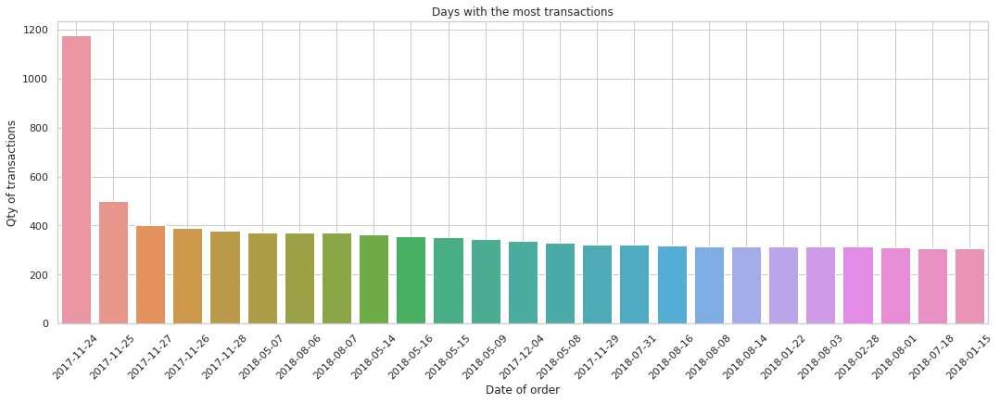

In [0]:
#most transactions per day
transactions_qty_pd_df = transactions_qty_df.toPandas()
transactions_qty_pd_df = transactions_qty_pd_df.sort_values(by='qty', ascending=False).head(25)

plt.figure(figsize=(18, 6))
sns.barplot(data=transactions_qty_pd_df, x='order_date', y='qty')

plt.xlabel('Date of order')
plt.ylabel('Qty of transactions')
plt.title('Days with the most transactions')
plt.xticks(rotation=45)
plt.grid(True)

plt.show()

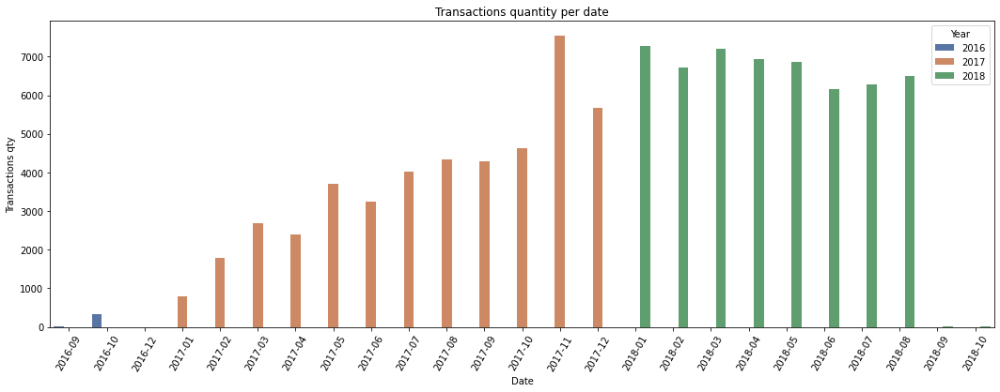

In [0]:
#sum of transactions (month by month)
by_month_pd_df = by_month_df.toPandas()
by_month_pd_df['year_month'] = by_month_pd_df['year'].astype(str) + '-' + by_month_pd_df['month'].astype(str).str.zfill(2)

x = by_month_pd_df['year_month']
y = by_month_pd_df['qty']

plt.figure(figsize=(18, 6))
sns.barplot(data=by_month_pd_df, x='year_month', y='qty', hue='year', palette='deep')

plt.xlabel('Date')
plt.ylabel('Transactions qty')
plt.title('Transactions quantity per date')
plt.xticks(rotation=60)
plt.legend(title='Year')

plt.show()

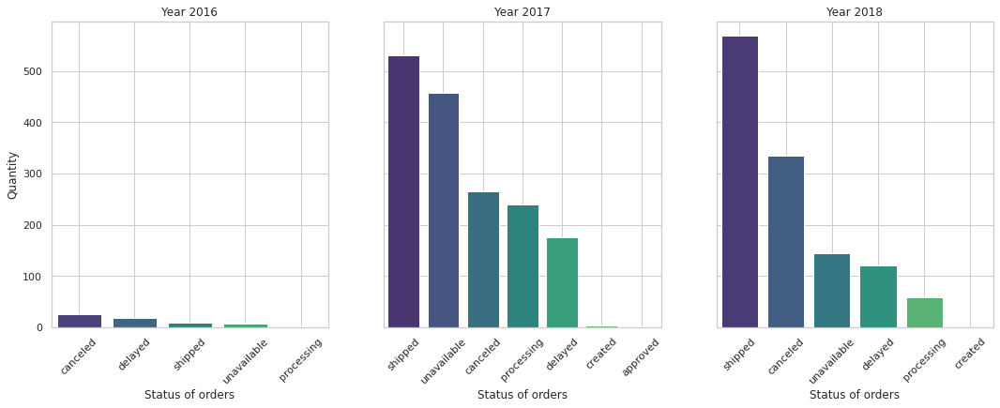

In [0]:
#status of orders per year 
undelivered_filtered_df = undelivered_df.filter(undelivered_df['order_status'] != 'delivered') #excluding 'delivered' for better readness
undelivered_pd_df = undelivered_filtered_df.toPandas()

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 6), sharey=True)

years = undelivered_pd_df['year'].unique()
for i, year in enumerate(years):
    data = undelivered_pd_df[undelivered_pd_df['year'] == year]
    ax = axes[i]
    sns.barplot(data=data, x='order_status', y='qty', ax=ax, palette="viridis")
    ax.set_xlabel('Status of orders')
    if i == 0:  # tylko pierwszy subplot potrzebuje etykiety osi Y
        ax.set_ylabel('Quantity')
    else:
        ax.set_ylabel('')
    ax.set_title(f'Year {year}')
    ax.tick_params(axis='x', rotation=45)
    ax.grid(True)

plt.show()

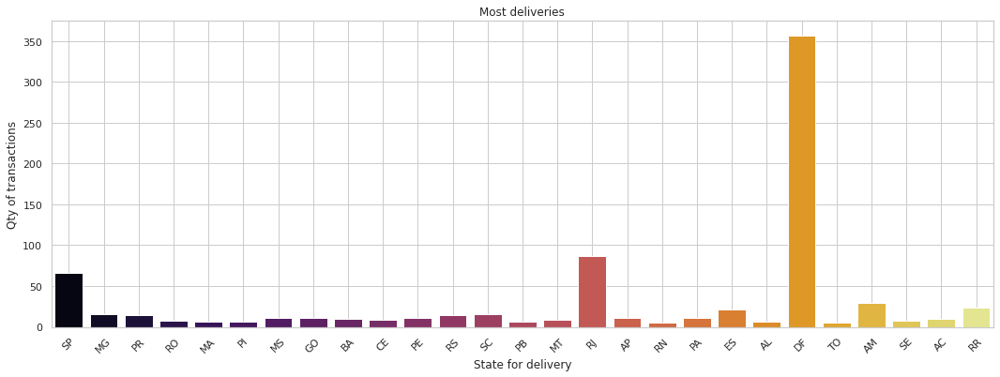

In [0]:
#best destinations - states
best_dest_pd_df = best_dest_df.toPandas()

plt.figure(figsize=(18, 6))
sns.barplot(data=best_dest_pd_df, x='customer_state', y='qty', palette="inferno", ci=None)

plt.xlabel('State for delivery')
plt.ylabel('Qty of transactions')
plt.title('Most deliveries')
plt.xticks(rotation=45)
plt.grid(True)

plt.show()